$$ Credit \space Score  $$
$$ Machine \space Learning \space 1 $$
$$ Logistic \space Regression  $$

# `01` Import Necessary Libraries

## `i` Default Libraries

In [283]:
from pathlib import Path
import pandas as pd
import numpy as np
import tarfile
import urllib.request

## `ii` Additional Libraries
Add imports for additional libraries you used throughout the notebook

In [284]:
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, RobustScaler, LabelEncoder, MinMaxScaler
from sklearn.linear_model import LogisticRegression , SGDClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score, f1_score

pd.set_option('display.max_columns', None)

import warnings
warnings.simplefilter("ignore")

----------------------------

# `02` Load Data

Note: Make sure the `Data` folder attached with the notebook is in the same path for this cell to work properly.

[Dataset Link](https://www.kaggle.com/datasets/parisrohan/credit-score-classification)

In [333]:
credit = pd.read_csv("/content/train.csv")
credit.head().style.background_gradient(cmap='Blues')

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7,11.27,4.000000,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,nan,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",-1,nan,11.27,4.000000,Good,809.98,31.944960,nan,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,nan,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7,_,4.000000,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,nan,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",5,4,6.27,4.000000,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",6,nan,11.27,4.000000,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


---

## `#` About Data:
- You are working as a data scientist in a global finance company. Over the years, the company has collected basic bank details and gathered a lot of credit-related information.
-  The management wants to build an intelligent system to segregate the people into credit score brackets to reduce the manual efforts. <br>
---
- The columns are as follows, their names are pretty self explanitory:
  - 1. `ID`: Unique identifier for each entry.  
  - 2. `Customer_ID`: Unique identifier for each customer.  
  - 3. `Month`: The month of the recorded transaction or data entry.  
  - 4. `Name`: Customer’s full name.  
  - 5. `Age`: The age of the customer in years.  
  - 6. `SSN`: Social Security Number (used for identity verification).  
  - 7. `Occupation`: The profession of the customer.  
  - 8. `Annual_Income`: The customer’s yearly income in USD.  
  - 9. `Monthly_Inhand_Salary`: The customer’s monthly net salary after deductions.  
  - 10. `Num_Bank_Accounts`: The number of bank accounts the customer holds.  
  - 11. `Interest_Rate`: Interest rate applied to the customer’s credit card.  
  - 12. `Num_of_Loan`: The total number of loans taken by the customer.  
  - 13. `Type_of_Loan`: The type(s) of loan taken (e.g., home loan, personal loan, car loan).  
  - 14. `Delay_from_due_date`: The average number of days a payment is delayed from its due date.  
  - 15. `Num_of_Delayed_Payment`: The total number of payments delayed by the customer.  
  - 16. `Changed_Credit_Limit`: The percentage change in the customer’s credit limit.  
  - 17. `Num_Credit_Inquiries`: The number of times the customer has applied for credit.  
  - 18. `Credit_Mix`: Classification of the types of credit accounts (e.g., revolving, installment).  
  - 19. `Outstanding_Debt`: The total amount of debt the customer still owes in USD.  
  - 20. `Credit_Utilization_Ratio`: The percentage of the credit limit that the customer is using.  
  - 21. `Credit_History_Age`: The number of years the customer has had a credit history.  
  - 22. `Payment_of_Min_Amount`: Whether the customer pays only the minimum amount due on credit cards (Yes/No).  
  - 23. `Total_EMI_per_month`: The total amount of Equated Monthly Installments (EMI) the customer pays.  
  - 24. `Amount_invested_monthly`: The amount the customer invests per month in USD.  
  - 25. `Payment_Behaviour`: A summary of how the customer makes payments (full, minimum, late, etc.).  
  - 26. `Monthly_Balance`: The remaining balance the customer has at the end of each month in USD.  
  - 27. `Credit_Score`: The classification of the customer’s creditworthiness (Poor, Standard, Good).  

---

## `#` Questions:
### <u>General Questions :</u>

- 1- Are there any missing values in our dataset?
- 2- Are there any duplicated values in our dataset?
- 3- What is the numerical description of our dataset?
- 4- What is the categorical description of our dataset?
- 5- What is the number of unique values in each column in our dataset?
- 6- Initial Data Assessment.
- 7- what is the distribution of each numerical columns?
- 8- what is the count of each categorical column?
- 9- Is there outliers in our data?

    


---
## `#` Create Test Set

Before exploring the data, let's split the data into training and test sets. You shouldn't touch the test set from this point furthur except for final model evaluation.

Use:
- `random_state` $= 1234$
- `test_size` $= 0.2$

Hint: You can use `sklearn.model_selection.train_test_split` function

In [334]:
credit_train, credit_test = train_test_split(credit, test_size=0.2, stratify= credit['Credit_Score'], random_state=1234)

----------------

# `03` Exploratory Data Analysis (EDA)

## `i` Simple Analysis

Preview data, perform statistical data analysis and explore as much as needed to better understand the data set we're dealing with.

`Notes:`
- Feel free to look up EDA approaches online for inspiration (however you **must understand** everything and not copy paste).
- Make sure to add notes and insights extracted from your analysis.


In [ ]:
credit_train.head().style.background_gradient(cmap='Blues')

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
24171,0xa3a1,CUS_0x21a3,April,Simon Jessoph,33,185-07-6882,Journalist,17774.97,1233.247500,6,9,33,9,"Mortgage Loan, Student Loan, Auto Loan, Home Equity Loan, Mortgage Loan, Payday Loan, Home Equity Loan, Credit-Builder Loan, and Not Specified",54,25,28.93,13.000000,Bad,3183.68,27.439128,10 Years and 0 Months,Yes,126.710179,135.19444277006596,Low_spent_Small_value_payments,151.42012841148204,Standard
46964,0x1292e,CUS_0xbe68,May,Lucia Mutikanig,15,969-71-6824,Developer,58726.71,5167.892500,6,7,33,6,"Not Specified, Auto Loan, Credit-Builder Loan, Mortgage Loan, Credit-Builder Loan, and Debt Consolidation Loan",16,25,27.96,10.000000,_,3544.22,34.532235,nan,Yes,225.769443,612.016564562601,Low_spent_Small_value_payments,nan,Good
52796,0x14b5a,CUS_0x2391,May,Jennifer Ablanh,21,046-96-1490,Architect,76154.56,6433.213333,7,8,26,6,"Home Equity Loan, Debt Consolidation Loan, Home Equity Loan, Home Equity Loan, Payday Loan, and Personal Loan",44,23,5.03,9.000000,Bad,2144.36,37.340570,13 Years and 9 Months,NM,62474.000000,121.4557412188847,High_spent_Medium_value_payments,450.74217370605004,Poor
13847,0x6721,CUS_0x9ab6,August,nan,25,999-17-4007,Mechanic,37909.82,3043.151667,4,4,9,3,"Personal Loan, Debt Consolidation Loan, and Credit-Builder Loan",7,10,11.44,nan,Standard,1821.39,30.699513,16 Years and 2 Months,Yes,87.146412,184.3189718757384,Low_spent_Medium_value_payments,312.8497826327,Poor
52121,0x14767,CUS_0x41ea,February,Lindaz,41_,733-38-8328,Teacher,37261.31,nan,5,2,5,4,"Payday Loan, Student Loan, Debt Consolidation Loan, and Not Specified",8,5,1.01,1.000000,Good,95.89,22.904288,19 Years and 4 Months,No,123.114072,197.7502870007006,High_spent_Small_value_payments,233.94655814745255,Good


## `ii` Visual Analysis

Plot graphs and relations in order to gain more insights about the data set, identify patterns, and make assumptions.

`Notes:`
- Feel free to look up visual EDA approaches online for inspiration (however you **must understand** everything and not copy paste).
- Make sure to add notes and insights extracted from your analysis.

In [ ]:
credit_train.shape

(80000, 28)

In [ ]:
credit_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 80000 entries, 24171 to 22157
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        80000 non-null  object 
 1   Customer_ID               80000 non-null  object 
 2   Month                     80000 non-null  object 
 3   Name                      71945 non-null  object 
 4   Age                       80000 non-null  object 
 5   SSN                       80000 non-null  object 
 6   Occupation                80000 non-null  object 
 7   Annual_Income             80000 non-null  object 
 8   Monthly_Inhand_Salary     67966 non-null  float64
 9   Num_Bank_Accounts         80000 non-null  int64  
 10  Num_Credit_Card           80000 non-null  int64  
 11  Interest_Rate             80000 non-null  int64  
 12  Num_of_Loan               80000 non-null  object 
 13  Type_of_Loan              70858 non-null  object 
 14  Delay_f

- There are many null so the datatypes are not accurate.

In [ ]:
#Check Missing
credit_train.isnull().sum()

,0
ID,0
Customer_ID,0
Month,0
Name,8055
Age,0
SSN,0
Occupation,0
Annual_Income,0
Monthly_Inhand_Salary,12034
Num_Bank_Accounts,0


In [ ]:
credit_train.isna().sum()/credit_train.shape[0]*100

,0
ID,0.00000
Customer_ID,0.00000
Month,0.00000
Name,10.06875
Age,0.00000
SSN,0.00000
Occupation,0.00000
Annual_Income,0.00000
Monthly_Inhand_Salary,15.04250
Num_Bank_Accounts,0.00000


- There are many missing values :(

In [ ]:
#Check duplicates
credit_train.duplicated().sum()

0

In [ ]:
credit_train.duplicated(subset=['Customer_ID', 'Month']).sum()

0

In [ ]:
#check uniqueness
credit_train.nunique()

,0
ID,80000
Customer_ID,12500
Month,8
Name,10139
Age,1476
SSN,12501
Occupation,16
Annual_Income,17842
Monthly_Inhand_Salary,13169
Num_Bank_Accounts,805


### Numerical Columns:

In [ ]:
obj_cols = credit_train.select_dtypes(include='object').columns
num_cols = credit_train.select_dtypes(exclude='object').columns[:-1]
print(f'Object columns : {obj_cols}', end='\n\n')
print(f'Numberical columns : {num_cols}')

Object columns : Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Num_of_Loan', 'Type_of_Loan',
       'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Credit_Mix',
       'Outstanding_Debt', 'Credit_History_Age', 'Payment_of_Min_Amount',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

Numberical columns : Index(['Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
       'Interest_Rate', 'Delay_from_due_date', 'Num_Credit_Inquiries',
       'Credit_Utilization_Ratio'],
      dtype='object')


In [ ]:
credit_train.describe(exclude = "object").T.style.background_gradient(cmap='Blues')

,count,mean,std,min,25%,50%,75%,max
Monthly_Inhand_Salary,67966.000000,4197.098054,3182.558179,303.645417,1625.165833,3097.025000,5971.186667,15204.633333
Num_Bank_Accounts,80000.000000,16.942325,116.477642,-1.000000,3.000000,6.000000,7.000000,1798.000000
Num_Credit_Card,80000.000000,22.782512,130.465434,0.000000,4.000000,5.000000,7.000000,1499.000000
Interest_Rate,80000.000000,73.452600,470.385622,1.000000,8.000000,13.000000,20.000000,5797.000000
Delay_from_due_date,80000.000000,21.056675,14.846748,-5.000000,10.000000,18.000000,28.000000,67.000000
Num_Credit_Inquiries,78416.000000,27.817499,193.626152,0.000000,3.000000,6.000000,9.000000,2597.000000
Credit_Utilization_Ratio,80000.000000,32.289202,5.125866,20.000000,28.046649,32.313325,36.505574,50.000000
Total_EMI_per_month,80000.000000,1378.392204,8196.939040,0.000000,30.220979,68.978422,160.392925,82331.000000


### Categorical Columns:

In [ ]:
credit_train.describe(include="object").T.style.background_gradient(cmap='Blues')

,count,unique,top,freq
ID,80000,80000,0xa3a1,1
Customer_ID,80000,12500,CUS_0x21a3,8
Month,80000,8,March,10084
Name,71945,10139,Stevex,33
Age,80000,1476,28,2286
SSN,80000,12501,#F%$D@*&8,4490
Occupation,80000,16,_______,5625
Annual_Income,80000,17842,109945.32,13
Num_of_Loan,80000,365,3,11508
Type_of_Loan,70858,6260,Not Specified,1137


In [ ]:
columns_list = ['Month', 'Occupation', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_Score']

for col in columns_list:
    print(f"\n Value counts for {col}:\n")
    print(credit_train[col].value_counts())


 Value counts for Month:

Month
March       10084
February    10029
April       10014
January     10013
August      10007
May          9962
June         9952
July         9939
Name: count, dtype: int64

 Value counts for Occupation:

Occupation
_______          5625
Lawyer           5270
Engineer         5066
Mechanic         5052
Scientist        5049
Architect        5041
Accountant       5003
Developer        4991
Entrepreneur     4970
Media_Manager    4958
Teacher          4949
Doctor           4877
Journalist       4875
Manager          4816
Musician         4749
Writer           4709
Name: count, dtype: int64

 Value counts for Credit_Mix:

Credit_Mix
Standard    29205
Good        19498
_           16141
Bad         15156
Name: count, dtype: int64

 Value counts for Payment_of_Min_Amount:

Payment_of_Min_Amount
Yes    41832
No     28589
NM      9579
Name: count, dtype: int64

 Value counts for Payment_Behaviour:

Payment_Behaviour
Low_spent_Small_value_payments      20423
High_s

---
 ### <u>Univariate Data Visualizations :</u>

`#` Numerical:

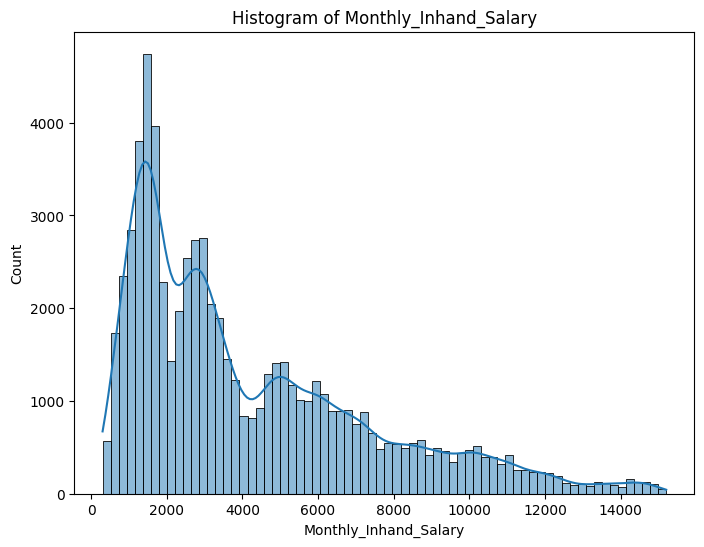

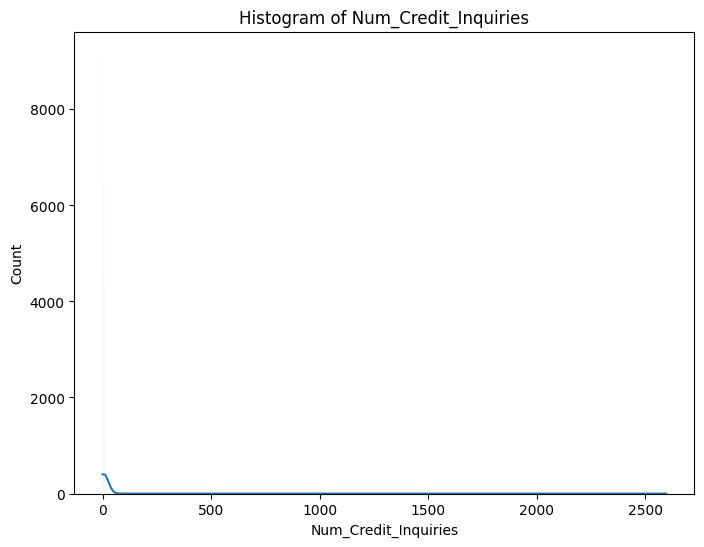

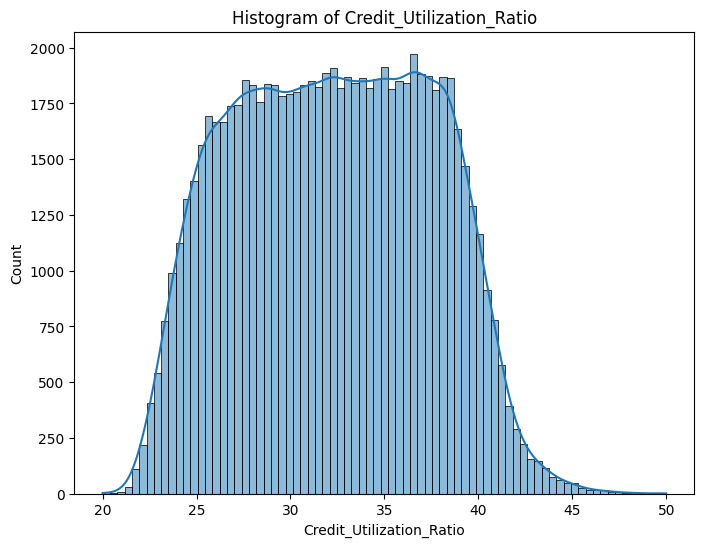

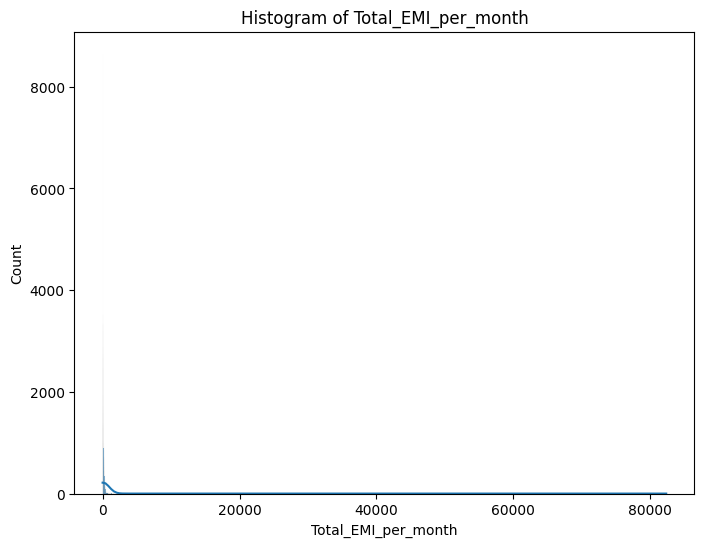

In [ ]:
numeric_cols = credit_train.select_dtypes(include = ["float64"]).columns

for col in numeric_cols :
    plt.figure(figsize=(8,6))
    sns.histplot(data = credit_train , x= col , kde=True )
    plt.title(f"Histogram of {col}")
    plt.show()

- `'Monthly_Inhand_Salary'` , `'Delay_from_due_date'` seemed to have `3` peaks.

`#` Categorical:

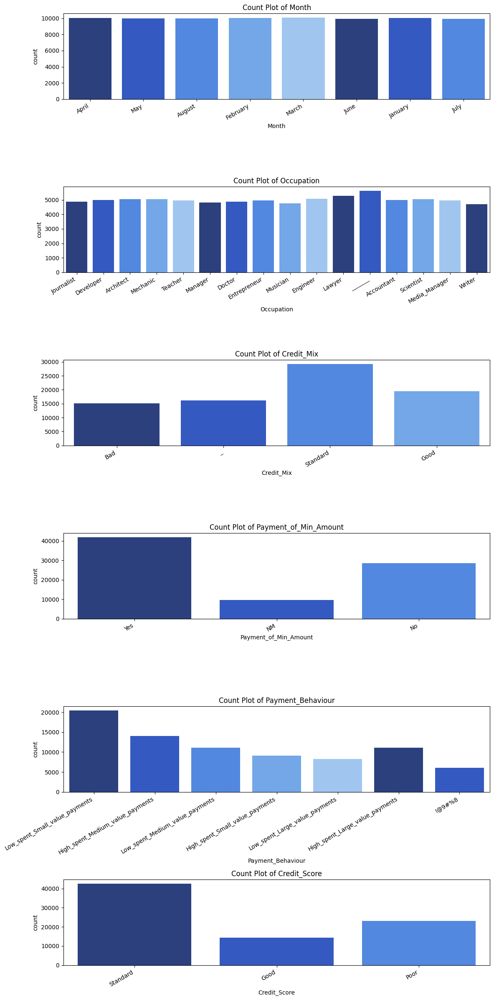

In [ ]:
colors = ['#1E3A8A', '#1D4ED8', '#3B82F6', '#60A5FA', '#93C5FD']

plt.figure(figsize=(12, len(columns_list) * 4))
for i, col in enumerate(columns_list, 1):
    plt.subplot(len(columns_list), 1, i)
    sns.countplot(data=credit_train, x=col, palette=colors)
    plt.title(f"Count Plot of {col}")
    plt.xticks(rotation=30, ha='right')

plt.tight_layout()
plt.show()


---
### <u>Check outliers:</u>

In [ ]:
numeric_cols = credit_train.select_dtypes(include=["float64"])

Q1 = numeric_cols.quantile(0.25)
Q3 = numeric_cols.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (numeric_cols < lower_bound) | (numeric_cols > upper_bound)

outlier_counts = outliers_mask.sum(axis=0)

total_rows = numeric_cols.shape[0]
outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": outlier_counts,
    "Outlier Percentage": outlier_percentage
})

outliers_summary.style.background_gradient(cmap='Blues')

,Number of Outliers,Outlier Percentage
Monthly_Inhand_Salary,1318,1.647500
Num_Credit_Inquiries,1324,1.655000
Credit_Utilization_Ratio,4,0.005000
Total_EMI_per_month,5471,6.838750


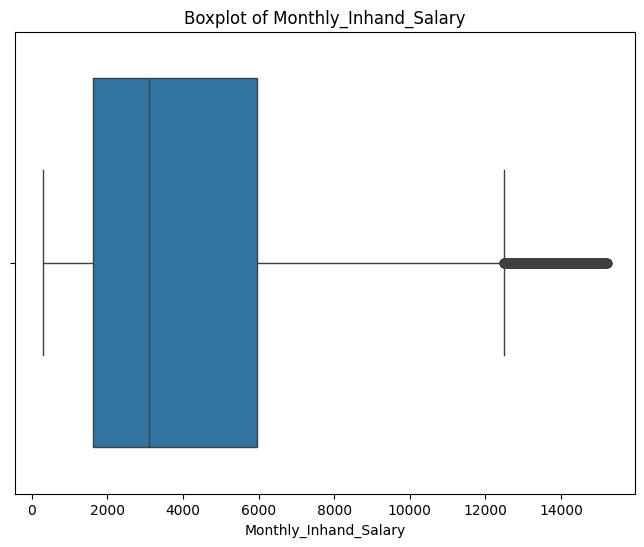

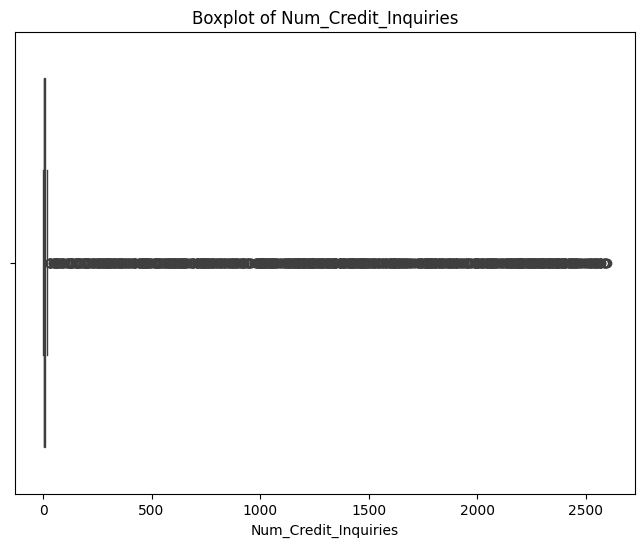

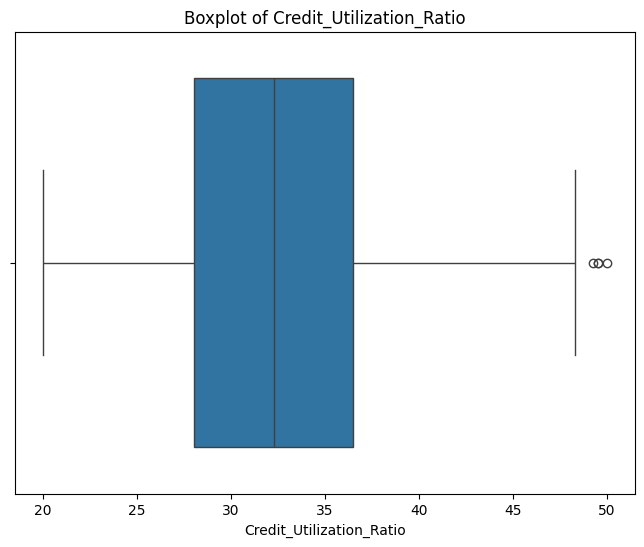

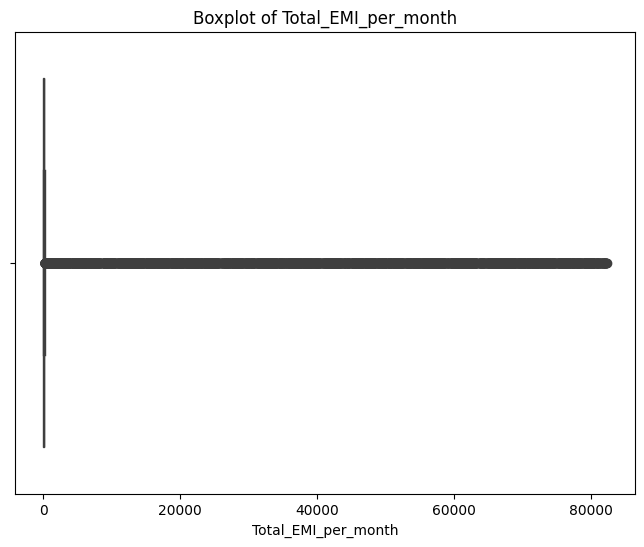

In [ ]:
numeric_cols = credit_train.select_dtypes(include=["float64"]).columns

for col in numeric_cols:
    plt.figure(figsize=(8, 6))

    sns.boxplot(x= credit_train[col], orient="h")

    plt.xlabel(col)
    plt.title(f"Boxplot of {col}")

    plt.show()

In [ ]:
report = ProfileReport(credit_train, title="Credit Data Report", explorative=True)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]




## -<u>`Insights`:</u>

### **General Overview**  
- The dataset contains **80,000 observations** and **28 variables**.  
- **2.1% of the data is missing**, with **48,024 missing cells** in total.  
- There are **no duplicate rows**, meaning all records are unique.  
- The dataset occupies **109 MB** in memory, with each record averaging **1.4 KB**.

---

### **Data Quality & Issues**  
1. **Missing Values:**  
   - Several columns have missing data, including:
     - **"Name" (10%)**
     - **"Type_of_Loan" (11.4%)**
     - **"Num_of_Delayed_Payment" (7%)**
     - **"Credit_History_Age" (9%)**
     - **"Monthly_Inhand_Salary" (15.1%)**
     - **"Amount_invested_monthly" (4.5%)**
     - **"Monthly_Balance" (1.2%)**  
   - Missing values may need imputation or handling, depending on their importance.

2. **Potential Data Entry Issues:**  
   - **"Num_Bank_Accounts"** has negative values (**-1**), which is unrealistic.  
   - **"Delay_from_due_date"** also contains negative values, which may indicate early payments but need verification.  
   - **"SSN"** contains non-standard characters in some entries, indicating possible data corruption.  


---

### **Observations**  
1. **Customer Distribution & Uniqueness:**  
   - **"Customer_ID"** has **12,500 unique values**, meaning some customers appear multiple times.  
   - The **"ID"** column is completely unique, acting as a primary key.  

2. **Income & Financial Behavior:**  
   - The **average monthly in-hand salary** is **4,190.98**, but **15.1% of values are missing**.  
   - **"Num_Bank_Accounts"** has a high mean of **17.26**, but some values seem unrealistic (e.g., max **1,798** accounts).  
   - **"Num_Credit_Card"** averages **22.55**, which is quite high, suggesting potential data errors or a specific population.  
   - **"Credit_Utilization_Ratio"** has a range from **20.1% to 50%**, with an average of **32.27%**, indicating most customers are using a moderate portion of their credit limits.  

3. **Loan & Credit Patterns:**  
   - **"Type_of_Loan"** includes multiple loans per customer, suggesting customers may have multiple credit lines.  
   - **"Num_of_Delayed_Payment"** has **7% missing values**, which could impact credit risk analysis.  
   - **"Interest_Rate"** has a wide range (from **1% to 5797%**), which may indicate outliers or incorrect values.  

4. **Credit Score & Risk Analysis:**  
   - **"Credit_Score"** has 3 categories:
     - **Standard (53%)**
     - **Poor (29%)**
     - **Good (18%)**  
   - This suggests that a significant portion of customers have below-average credit ratings.  
   - **"Credit_Mix"** shows most customers fall into "Standard" (36%) and "Good" (24%), while others have missing or undefined credit mixes.  

---


### <u>Bivariate Data Visualizations :</u>

`#` Numerical:

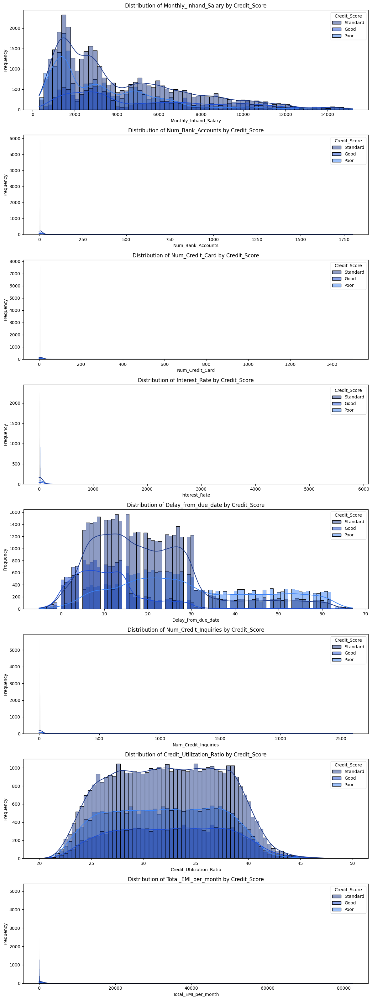

In [ ]:
numerical_columns = credit_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
target = 'Credit_Score'


colors = ['#1E3A8A', '#1D4ED8', '#3B82F6', '#60A5FA', '#93C5FD']

plt.figure(figsize=(12, len(numerical_columns) * 4))

for i, col in enumerate(numerical_columns, 1):
    plt.subplot(len(numerical_columns), 1, i)
    sns.histplot(data=credit_train, x=col, hue=target, kde=True, palette=colors)
    plt.title(f"Distribution of {col} by {target}")
    plt.xlabel(col)
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


- `'Monthly_Inhand_Salary'` , `'Delay_from_due_date'` seemed to have `3` peaks.

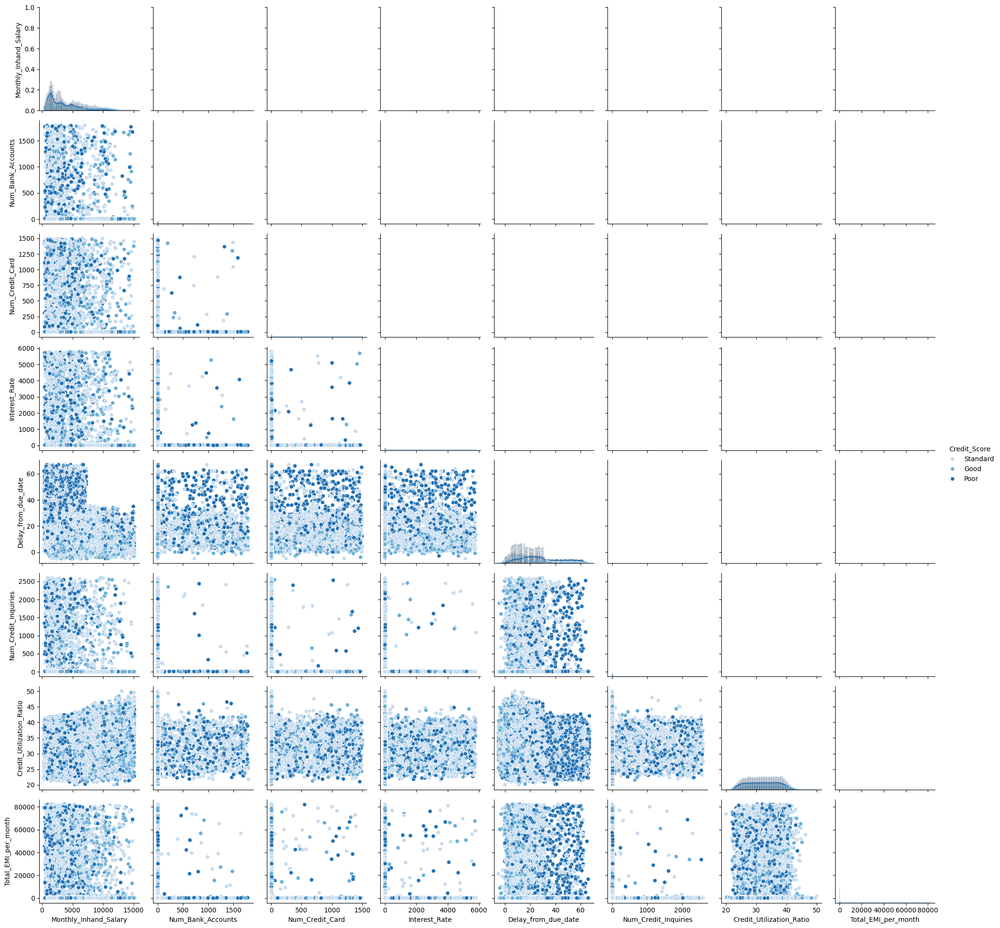

In [ ]:
plot = sns.PairGrid(credit_train, vars=numerical_columns, hue=target, palette="Blues")
plot.map_lower(sns.scatterplot)
plot.map_diag(sns.histplot,kde=True)
plot.add_legend()

plt.show()

`#` Categorical:

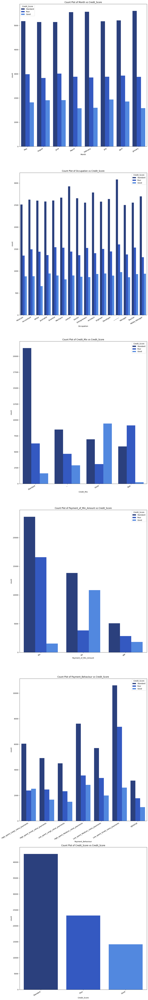

In [ ]:
plt.figure(figsize=(12, len(obj_cols) * 4))

for i, col in enumerate(columns_list, 1):
    plt.subplot(len(columns_list), 1, i)
    sns.countplot(data=credit_train, x=col, hue=target, palette=colors)
    plt.title(f"Count Plot of {col} vs {target}")
    plt.xticks(rotation=30, ha='right')

plt.tight_layout()
plt.show()


<Axes: >

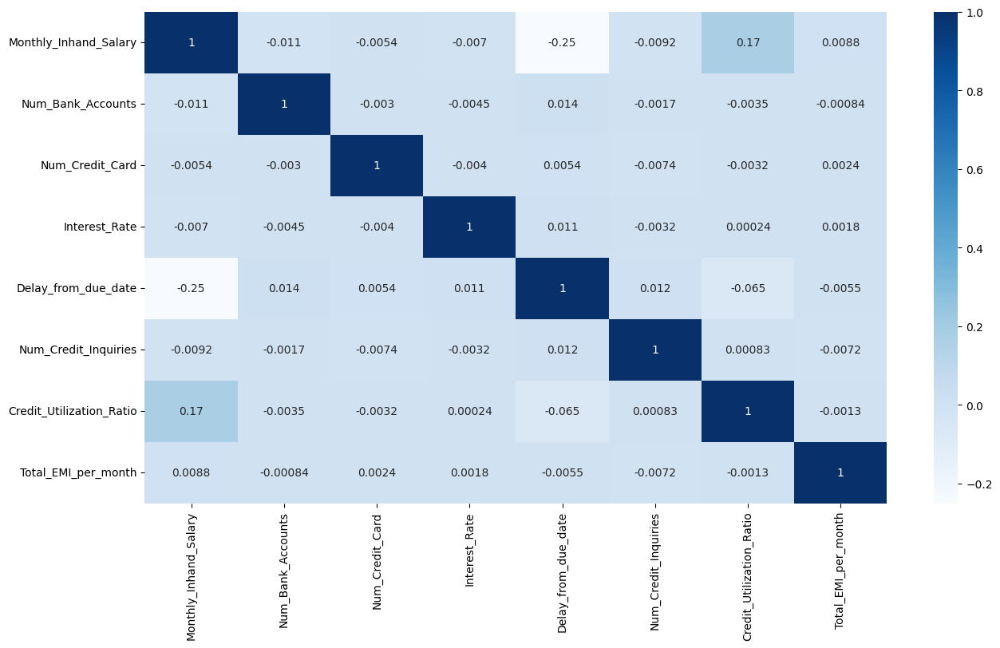

In [ ]:
plt.figure(figsize=(15, 8))
sns.heatmap(credit_train[numerical_columns].corr(), cmap = 'Blues' ,annot=True)

----------------

# `04` Data Preparation

Perform data cleaning, feature engineering, scaling, dropping unwanted columns (such as IDs), etc. as needed to make sure it's ready for the model.

`Q` Is this dataset *skewed*?

Hint: It could be helpful to check `sklearn.preprocessing` module.

`i` Most important columns:
- `'Num_of_Delayed_Payment'`
- `'Delay_from_due_date'`
- `'Credit_Utilization_Ratio'`
- `'Outstanding_Debt'`
- `'Total_EMI_per_month'`
- `'Payment_Behaviour'`
- `'Changed_Credit_Limit'`
- `'Annual_Income'`

---
`#`  `'Num_of_Delayed_Payment'`

In [290]:
credit_train['Num_of_Delayed_Payment'].unique()

array(['25', '23', '10', '5', '16', '22', '14', '2_', '24', '3274',
       '1735', '20', '11', '19', '3539', nan, '8', '17', '13', '21', '12',
       '2', '18', '4', '9', '7', '0', '6', '15', '11_', '14_', '20_',
       '-1', '10_', '3', '26', '28', '16_', '3484', '-2', '9_', '47',
       '7_', '1', '12_', '13_', '19_', '22_', '3978', '17_', '15_', '27',
       '1_', '25_', '8_', '5_', '3_', '4_', '1685', '3488', '3796', '-3',
       '21_', '2323', '969', '18_', '23_', '3300', '1867', '2492', '848_',
       '662', '1236', '6_', '2072', '3355', '2913', '-2_', '2400', '523',
       '4037', '2438', '130', '3489', '2008', '0_', '290', '2658', '3793',
       '674', '1180', '162', '4095', '399', '1106', '1370', '2001',
       '1975', '3051', '1952', '264', '2413', '2506', '3754', '3447',
       '2324', '-1_', '1801', '24_', '1045', '4024', '2628', '2047',
       '4023', '223', '2204', '1211', '1301', '46', '3216', '2384',
       '1579', '4241', '2488', '4042', '700', '1014', '1541', '3404',


In [335]:
credit_train['Num_of_Delayed_Payment'] = credit_train['Num_of_Delayed_Payment'].str.replace('_','')

In [336]:
# Convert to numeric
credit_train['Num_of_Delayed_Payment'] = pd.to_numeric(credit_train['Num_of_Delayed_Payment'], errors='coerce')

# Fill missing values with median
median_value = credit_train['Num_of_Delayed_Payment'].median()
credit_train['Num_of_Delayed_Payment'].fillna(median_value, inplace=True)

# Convert to integer
credit_train['Num_of_Delayed_Payment'] = credit_train['Num_of_Delayed_Payment'].astype(int)

In [ ]:
credit_train['Num_of_Delayed_Payment'].isna().sum()

0

In [ ]:
credit_train['Num_of_Delayed_Payment'].value_counts().sort_index().head(50)

,count
Num_of_Delayed_Payment,
-3,78
-2,197
-1,261
0,1267
1,1318
2,1437
3,1538
4,1478
5,1655


- Negative values means that the customer pays `earlier than the time`.

In [337]:
col = 'Num_of_Delayed_Payment'

Q1 = credit_train[col].quantile(0.25)
Q3 = credit_train[col].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (credit_train[col] < lower_bound) | (credit_train[col] > upper_bound)

outlier_counts = outliers_mask.sum()

total_rows = credit_train.shape[0]

outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": [outlier_counts],
    "Outlier Percentage": [outlier_percentage]
})

outliers_summary.style.background_gradient(cmap='Blues')


,Number of Outliers,Outlier Percentage
0,586,0.732500


In [338]:
# Apply Robust Scaller
ro_scaler1 = RobustScaler()
credit_train[col] = ro_scaler1.fit_transform(credit_train[[col]])

In [339]:
# Apply Log Transformation
credit_train[col] = np.log1p(credit_train[col])

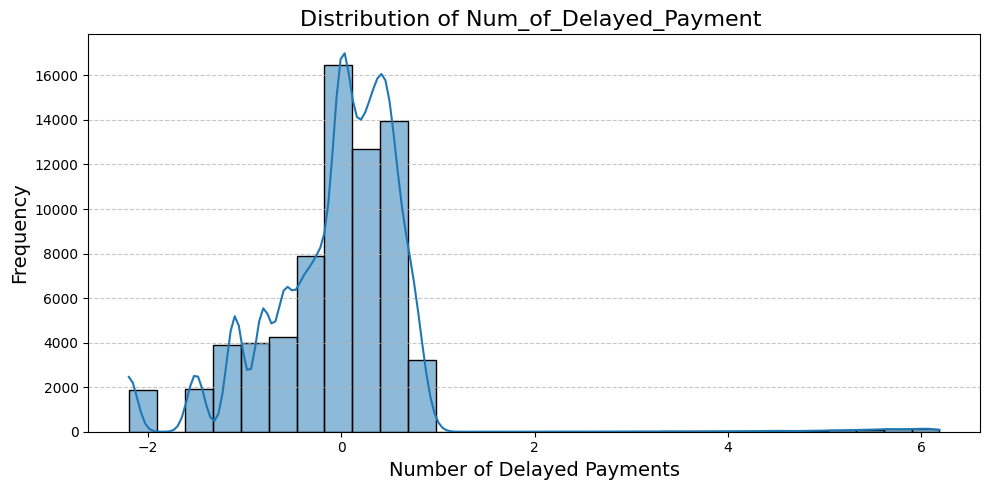

In [ ]:
# Histogram for num_of_delayed_payment
plt.figure(figsize=(10, 5))
sns.histplot(data=credit_train, x=col, bins=29, kde=True)

plt.title('Distribution of Num_of_Delayed_Payment ' , fontsize=16)
plt.xlabel('Number of Delayed Payments', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

---
`#`  `'Delay_from_due_date'`

In [ ]:
credit_train['Delay_from_due_date'].unique()

array([54, 16, 44,  7,  8,  3, 39, 30,  4, 41, 28, 10, 12, 35, 60,  9,  5,
       21, 18, 14, 53, 62, 24, 19, 34, 56, 22,  6,  0, 27, 23, 26, 17, 29,
       31, 13, 50, 15, 36,  1, 40, 11, 43, 25,  2, 59, 20, 46, 48, -1, 33,
       51, 52, 58, 55, 47, 45, 42, 32, 61, 38, -3, 57, 63, 37, 49, -2, -4,
       65, 64, 67, 66, -5])

- Negative values refer to `earlier payment times`.

In [ ]:
credit_train['Delay_from_due_date'].isna().sum()

0

In [340]:
col = 'Delay_from_due_date'

Q1 = credit_train[col].quantile(0.25)
Q3 = credit_train[col].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (credit_train[col] < lower_bound) | (credit_train[col] > upper_bound)

outlier_counts = outliers_mask.sum()

total_rows = credit_train.shape[0]

outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": [outlier_counts],
    "Outlier Percentage": [outlier_percentage]
})

outliers_summary.style.background_gradient(cmap='Blues')


,Number of Outliers,Outlier Percentage
0,3171,3.963750


In [341]:
# Apply Robust Scaller
ro_scaler2 = RobustScaler()
credit_train[col] = ro_scaler2.fit_transform(credit_train[[col]])

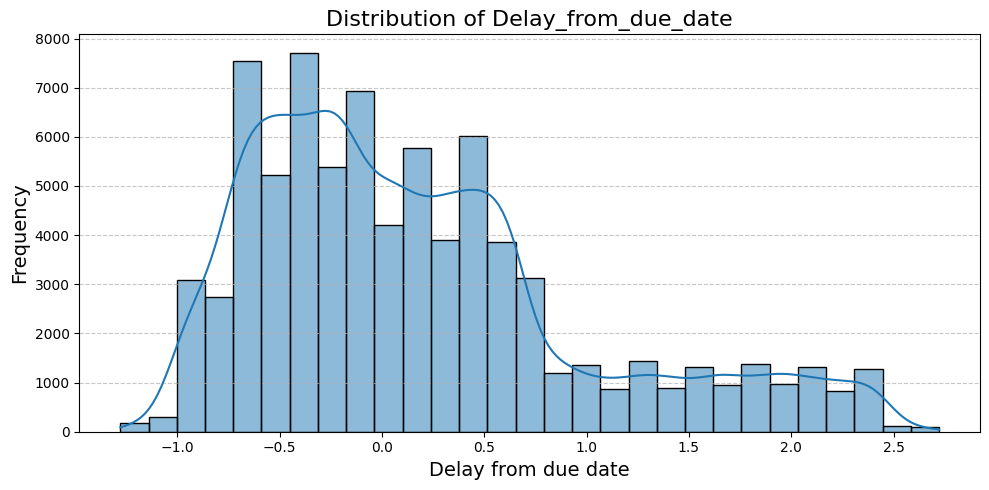

In [ ]:
# Histogram for 'Delay_from_due_date'
plt.figure(figsize=(10, 5))
sns.histplot(data=credit_train, x=col, bins=29, kde=True)

plt.title('Distribution of Delay_from_due_date' , fontsize=16)
plt.xlabel('Delay from due date', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

---
`#`  `'Credit_Utilization_Ratio'`

In [ ]:
credit_train['Credit_Utilization_Ratio'].unique()

array([27.43912824, 34.5322354 , 37.34057047, ..., 29.73534096,
       29.10815637, 29.44020689])

In [ ]:
credit_train[col].isna().sum()

0

In [342]:
col = 'Credit_Utilization_Ratio'

Q1 = credit_train[col].quantile(0.25)
Q3 = credit_train[col].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (credit_train[col] < lower_bound) | (credit_train[col] > upper_bound)

outlier_counts = outliers_mask.sum()

total_rows = credit_train.shape[0]

outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": [outlier_counts],
    "Outlier Percentage": [outlier_percentage]
})

outliers_summary.style.background_gradient(cmap='Blues')


,Number of Outliers,Outlier Percentage
0,4,0.005000


- There is no outliers.

In [343]:
# Now apply MinMaxScaler
scaler = MinMaxScaler()
credit_train['Credit_Utilization_Ratio'] = scaler.fit_transform(credit_train[['Credit_Utilization_Ratio']])

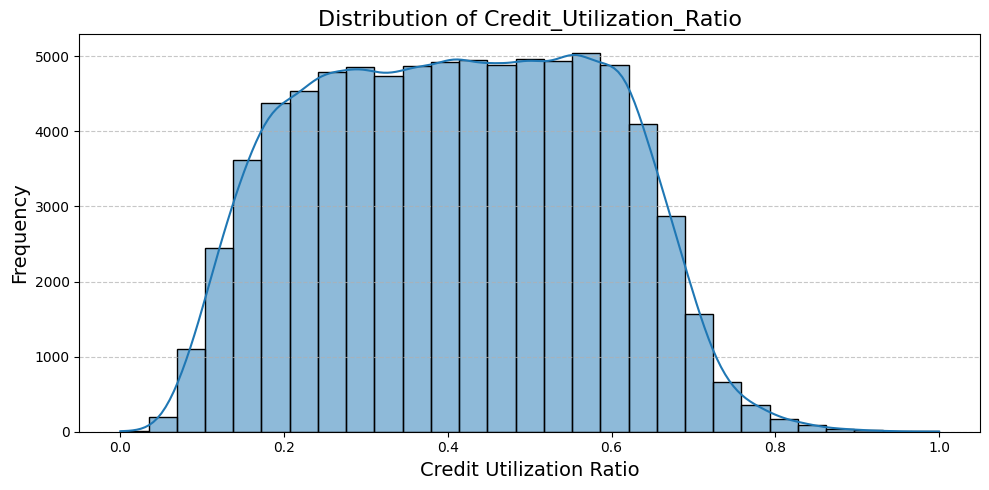

In [ ]:
# Histogram for 'Credit_Utilization_Ratio'
plt.figure(figsize=(10, 5))
sns.histplot(data=credit_train, x=col, bins=29, kde=True)

plt.title('Distribution of Credit_Utilization_Ratio' , fontsize=16)
plt.xlabel('Credit Utilization Ratio', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

---
`#`  `'Outstanding_Debt'`

In [ ]:
credit_train['Outstanding_Debt'].unique()

array(['3183.68', '3544.22', '2144.36', ..., '1059.46_', '814.52_',
       '1328.93_'], dtype=object)

In [344]:
# Remove _
credit_train['Outstanding_Debt'] = credit_train['Outstanding_Debt'].str.replace('_','')

In [ ]:
credit_train['Outstanding_Debt'].isna().sum()

0

In [345]:
# Convert to float
credit_train['Outstanding_Debt'] = credit_train['Outstanding_Debt'].astype(float)

In [346]:
col = 'Outstanding_Debt'

Q1 = credit_train[col].quantile(0.25)
Q3 = credit_train[col].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (credit_train[col] < lower_bound) | (credit_train[col] > upper_bound)

outlier_counts = outliers_mask.sum()

total_rows = credit_train.shape[0]

outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": [outlier_counts],
    "Outlier Percentage": [outlier_percentage]
})

outliers_summary.style.background_gradient(cmap='Blues')

,Number of Outliers,Outlier Percentage
0,4218,5.272500


In [347]:
# Apply Robust Scaller
ro_scaler3 = RobustScaler()
credit_train[col] = ro_scaler3.fit_transform(credit_train[[col]])

In [348]:
# Apply Log Transformation
credit_train[col] = np.log1p(credit_train[col])

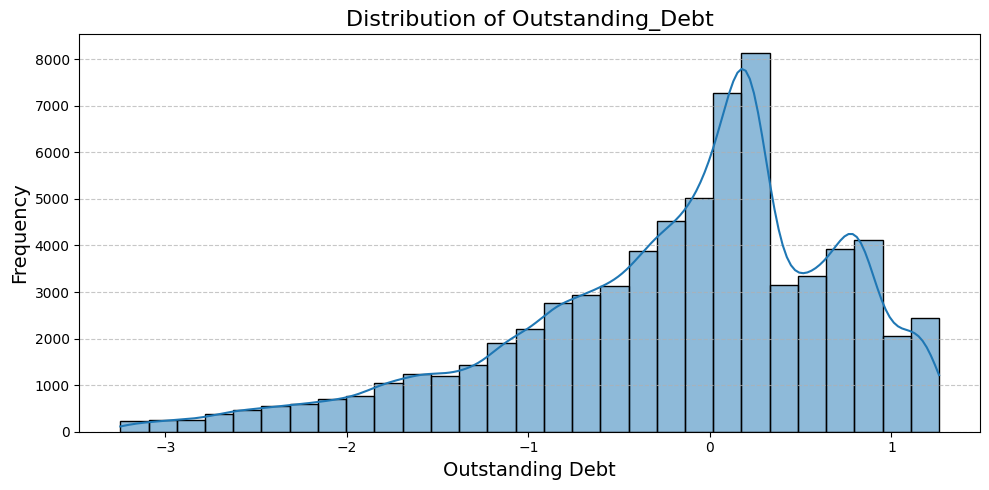

In [ ]:
# Histogram for 'Outstanding_Debt'
plt.figure(figsize=(10, 5))
sns.histplot(data=credit_train, x=col, bins=29, kde=True)

plt.title('Distribution of Outstanding_Debt' , fontsize=16)
plt.xlabel('Outstanding Debt', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

---
`#`  `'Total_EMI_per_month'`







In [ ]:
credit_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69906 entries, 0 to 69905
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        69906 non-null  object 
 1   Customer_ID               69906 non-null  object 
 2   Month                     69906 non-null  object 
 3   Name                      62849 non-null  object 
 4   Age                       69906 non-null  object 
 5   SSN                       69906 non-null  object 
 6   Occupation                69906 non-null  object 
 7   Annual_Income             69906 non-null  object 
 8   Monthly_Inhand_Salary     59341 non-null  float64
 9   Num_Bank_Accounts         69906 non-null  int64  
 10  Num_Credit_Card           69906 non-null  int64  
 11  Interest_Rate             69906 non-null  int64  
 12  Num_of_Loan               69906 non-null  object 
 13  Type_of_Loan              61510 non-null  object 
 14  Delay_

In [ ]:
credit_train['Total_EMI_per_month'].isna().sum()

0

In [349]:
#The value of total_emi_per_month should be around 30%-40% of the monthly income
credit_train['emi_lower_bound'] = credit_train['Monthly_Inhand_Salary'] * 0.30
credit_train['emi_upper_bound'] = credit_train['Monthly_Inhand_Salary'] * 0.40

# Adjust values that are outside the range
credit_train['Total_EMI_per_month'] = credit_train['Total_EMI_per_month'].clip(credit_train['emi_lower_bound'], credit_train['emi_upper_bound'])

# Drop the temporary bound columns
credit_train.drop(columns=['emi_lower_bound', 'emi_upper_bound'], inplace=True)


In [350]:
col = 'Total_EMI_per_month'

Q1 = credit_train[col].quantile(0.25)
Q3 = credit_train[col].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (credit_train[col] < lower_bound) | (credit_train[col] > upper_bound)

outlier_counts = outliers_mask.sum()

total_rows = credit_train.shape[0]

outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": [outlier_counts],
    "Outlier Percentage": [outlier_percentage]
})

outliers_summary.style.background_gradient(cmap='Blues')

,Number of Outliers,Outlier Percentage
0,2422,3.027500


In [351]:
# Apply Robust Scaller
ro_scaler4 = RobustScaler()
credit_train[col] = ro_scaler4.fit_transform(credit_train[[col]])

In [352]:
# Apply Log Transformation
credit_train[col] = np.log1p(credit_train[col])

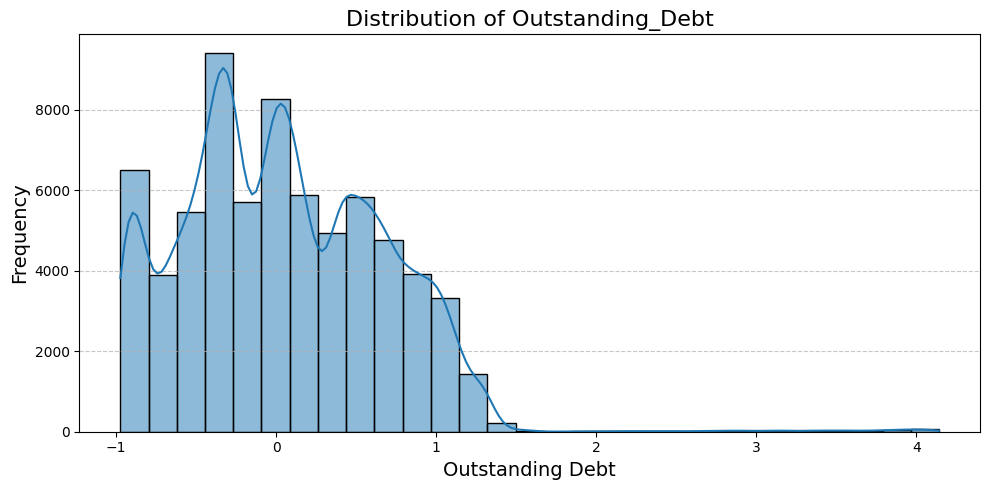

In [ ]:
# Histogram for 'Outstanding_Debt'
plt.figure(figsize=(10, 5))
sns.histplot(data=credit_train, x=col, bins=29, kde=True)

plt.title('Distribution of Outstanding_Debt' , fontsize=16)
plt.xlabel('Outstanding Debt', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

---
`#`  `'Payment_Behaviour'`



In [ ]:
credit_train['Payment_Behaviour'].unique()

array(['Low_spent_Small_value_payments',
       'High_spent_Medium_value_payments',
       'Low_spent_Medium_value_payments',
       'High_spent_Small_value_payments',
       'Low_spent_Large_value_payments',
       'High_spent_Large_value_payments', '!@9#%8'], dtype=object)

In [353]:
# Replace the invalid value with NaN
credit_train.loc[credit_train['Payment_Behaviour'] == "!@9#%8",'Payment_Behaviour'] = np.nan

# Calculate the overall mode of 'payment_behaviour' in the training set
payment_behaviour_mode = credit_train['Payment_Behaviour'].mode()[0]

# Fill missing values in the training data with this mode
credit_train['Payment_Behaviour'].fillna(payment_behaviour_mode, inplace=True)

In [ ]:
credit_train['Payment_Behaviour'].value_counts()

,count
Payment_Behaviour,
Low_spent_Small_value_payments,22864
High_spent_Medium_value_payments,12392
High_spent_Large_value_payments,9796
Low_spent_Medium_value_payments,9726
High_spent_Small_value_payments,7923
Low_spent_Large_value_payments,7205


In [354]:
# Initialize LabelEncoder
le1 = LabelEncoder()

# Fit on training data and transform
credit_train['Payment_Behaviour'] = le1.fit_transform(credit_train['Payment_Behaviour'])

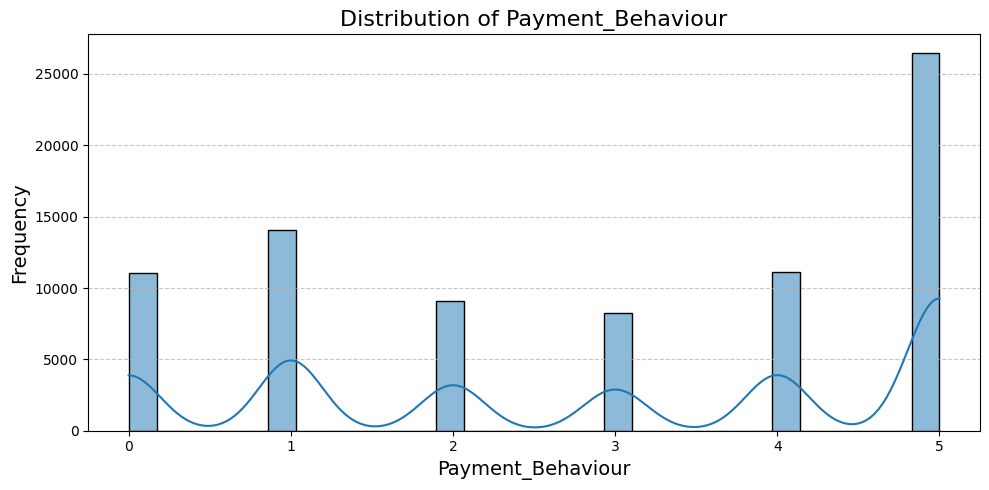

In [355]:
col = 'Payment_Behaviour'

# Histogram for 'Payment_Behaviour'
plt.figure(figsize=(10, 5))
sns.histplot(data=credit_train, x=col, bins=29, kde=True)

plt.title('Distribution of Payment_Behaviour' , fontsize=16)
plt.xlabel('Payment_Behaviour', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

---
`#`  `'Changed_Credit_Limit'`




In [243]:
credit_train['Changed_Credit_Limit'].value_counts()

,count
Changed_Credit_Limit,
_,1657
7.35,102
11.32,102
10.06,101
8.22,99
...,...
-0.35,1
2.140000000000001,1
-0.029999999999999805,1


In [356]:
# Replace the invalid value with NaN
credit_train.loc[credit_train['Changed_Credit_Limit'] == "_",'Changed_Credit_Limit'] = np.nan

# Convert the column to numeric, handling errors
credit_train['Changed_Credit_Limit'] = pd.to_numeric(credit_train['Changed_Credit_Limit'], errors='coerce')

# Calculate the median
median_value = credit_train['Changed_Credit_Limit'].median()

# Fill missing values with the median
credit_train['Changed_Credit_Limit'].fillna(median_value, inplace=True)

In [ ]:
credit_train['Changed_Credit_Limit'] .isna().sum()

0

In [357]:
col = 'Changed_Credit_Limit'

Q1 = credit_train[col].quantile(0.25)
Q3 = credit_train[col].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (credit_train[col] < lower_bound) | (credit_train[col] > upper_bound)

outlier_counts = outliers_mask.sum()

total_rows = credit_train.shape[0]

outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": [outlier_counts],
    "Outlier Percentage": [outlier_percentage]
})

outliers_summary.style.background_gradient(cmap='Blues')

,Number of Outliers,Outlier Percentage
0,1003,1.253750


In [358]:
# Apply Robust Scaller
ro_scaler5 = RobustScaler()
credit_train[col] = ro_scaler5.fit_transform(credit_train[[col]])

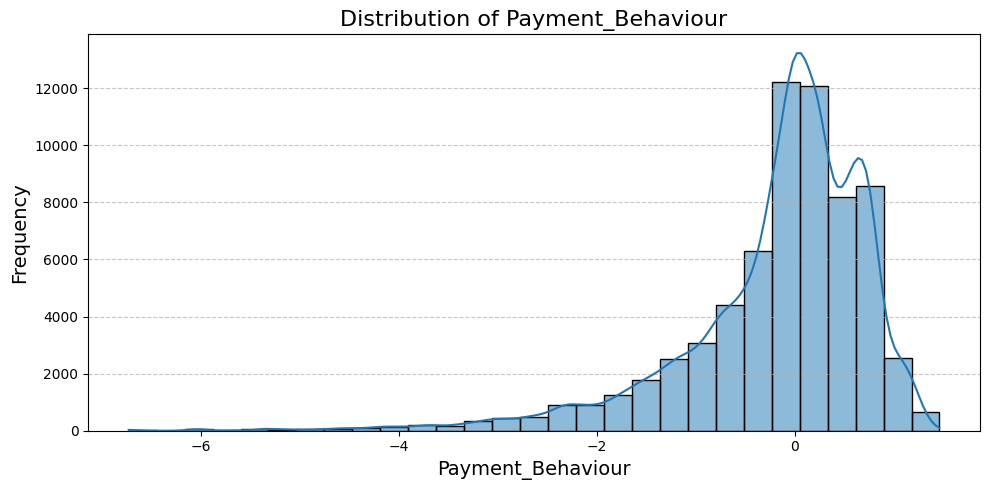

In [ ]:
# Histogram for 'Payment_Behaviour'
plt.figure(figsize=(10, 5))
sns.histplot(data=credit_train, x=col, bins=29, kde=True)

plt.title('Distribution of Payment_Behaviour' , fontsize=16)
plt.xlabel('Payment_Behaviour', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

---
`#`  `'Annual_Income'`





In [ ]:
credit_train['Annual_Income'].info()

<class 'pandas.core.series.Series'>
Index: 80000 entries, 24171 to 22157
Series name: Annual_Income
Non-Null Count  Dtype 
--------------  ----- 
80000 non-null  object
dtypes: object(1)
memory usage: 1.2+ MB


In [ ]:
credit_train['Annual_Income'].unique()

array(['17774.97', '58726.71', '76154.56', ..., '14630332.0', '17486.55_',
       '31985.64_'], dtype=object)

In [359]:
# Remove _
credit_train['Annual_Income'] = credit_train['Annual_Income'].str.replace('_','')

In [361]:
# Convert to float
credit_train['Annual_Income'] = credit_train['Annual_Income'].astype(float)

In [362]:
col = 'Annual_Income'

Q1 = credit_train[col].quantile(0.25)
Q3 = credit_train[col].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (credit_train[col] < lower_bound) | (credit_train[col] > upper_bound)

outlier_counts = outliers_mask.sum()

total_rows = credit_train.shape[0]

outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": [outlier_counts],
    "Outlier Percentage": [outlier_percentage]
})

outliers_summary.style.background_gradient(cmap='Blues')

,Number of Outliers,Outlier Percentage
0,2197,2.746250


In [363]:
# Apply Robust Scaller
ro_scaler6 = RobustScaler()
credit_train[col] = ro_scaler6.fit_transform(credit_train[[col]])

In [364]:
# Apply Log Transformation
credit_train[col] = np.log1p(credit_train[col])

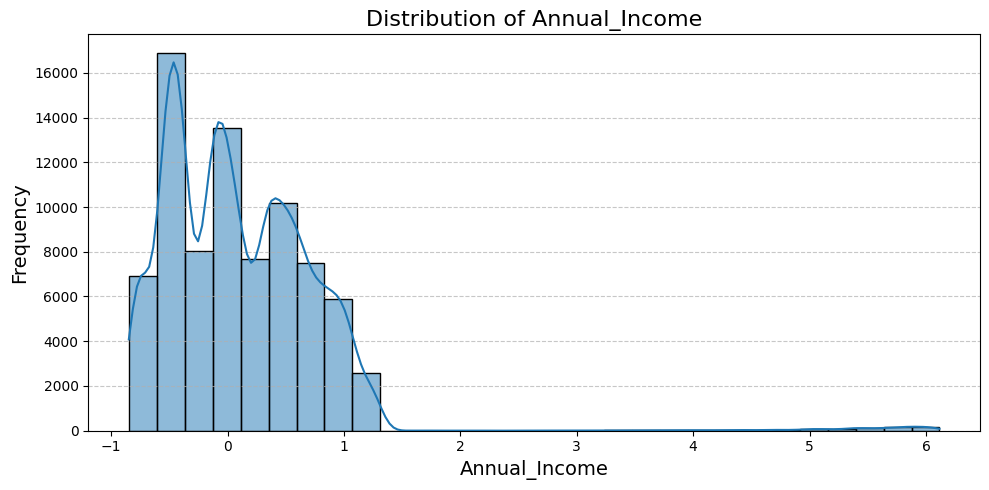

In [ ]:
# Histogram for 'Annual_Income'
plt.figure(figsize=(10, 5))
sns.histplot(data=credit_train, x=col, bins=29, kde=True)

plt.title('Distribution of Annual_Income' , fontsize=16)
plt.xlabel('Annual_Income', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

---

`#`  `'Credit_Score'`

In [365]:
# Initialize LabelEncoder
le2 = LabelEncoder()

# Fit on training data and transform
credit_train['Credit_Score'] = le2.fit_transform(credit_train['Credit_Score'])

In [ ]:
credit_train['Credit_Score'].value_counts()

,count
Credit_Score,
2,42539
1,23199
0,14262


## `Final Train`

In [366]:
selected_columns = ['Num_of_Delayed_Payment',
'Delay_from_due_date',
'Credit_Utilization_Ratio',
'Outstanding_Debt',
'Total_EMI_per_month',
'Payment_Behaviour',
'Changed_Credit_Limit',
'Annual_Income']


X_train = credit_train[selected_columns]
y_train = credit_train['Credit_Score']

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 80000 entries, 24171 to 22157
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Num_of_Delayed_Payment    80000 non-null  int64  
 1   Delay_from_due_date       80000 non-null  int64  
 2   Credit_Utilization_Ratio  80000 non-null  float64
 3   Outstanding_Debt          80000 non-null  float64
 4   Total_EMI_per_month       63191 non-null  float64
 5   Payment_Behaviour         80000 non-null  int64  
 6   Changed_Credit_Limit      80000 non-null  float64
dtypes: float64(4), int64(3)
memory usage: 4.9 MB


In [ ]:
X_train.isna().sum()

,0
Num_of_Delayed_Payment,7574
Delay_from_due_date,0
Credit_Utilization_Ratio,2968
Outstanding_Debt,0
Total_EMI_per_month,0
Payment_Behaviour,0
Changed_Credit_Limit,0


In [367]:
X_train.replace([np.inf, -np.inf], np.nan, inplace=True)
X_train.fillna(X_train.median(), inplace=True)

In [ ]:
X_train.isna().sum()

,0
Num_of_Delayed_Payment,0
Delay_from_due_date,0
Credit_Utilization_Ratio,0
Outstanding_Debt,0
Total_EMI_per_month,0
Payment_Behaviour,0
Changed_Credit_Limit,0


---
`#` Remove outliers:

In [255]:
Q1 = X_train.quantile(0.25)
Q3 = X_train.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (X_train < lower_bound) | (X_train > upper_bound)

outlier_counts = outliers_mask.sum(axis=0)

total_rows = X_train.shape[0]
outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": outlier_counts,
    "Outlier Percentage": outlier_percentage
})

outliers_summary.style.background_gradient(cmap='Blues')

,Number of Outliers,Outlier Percentage
Num_of_Delayed_Payment,4375,5.468750
Delay_from_due_date,3171,3.963750
Credit_Utilization_Ratio,4,0.005000
Outstanding_Debt,0,0.000000
Total_EMI_per_month,351,0.438750
Payment_Behaviour,0,0.000000
Changed_Credit_Limit,1003,1.253750
Annual_Income,790,0.987500


In [256]:
def remove_outliers(df):

    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    return df[~((df < lower_bound) | (df > upper_bound)).any(axis=1)]

In [257]:
X_train_no_outlier = remove_outliers(X_train)
# Get the indices of the rows that were kept after removing outliers
inlier_indices = X_train_no_outlier.index

# Use these indices to select the corresponding target values (y_train)
y_train_no_outlier = y_train.loc[inlier_indices]

---
`#` Handling Outliers

In [258]:
# Copy the original data to preserve X_train and y_train
X_train_handle_outlier = X_train.copy()

# Define columns to process
columns_to_clip = ['Num_of_Delayed_Payment', 'Outstanding_Debt', 'Annual_Income']

# Apply clipping for outliers
for col in columns_to_clip:
    lower = X_train[col].quantile(0.01)
    upper = X_train[col].quantile(0.99)
    X_train_handle_outlier[col] = np.clip(X_train[col], lower, upper)

---
---
`ii` Add more relevant columns:
- `'Num_Credit_Inquiries'`
- `'Credit_History_Age'`
- `'Monthly_Balance'`

---

`#`  `'Num_Credit_Inquiries'`

In [183]:
credit_train['Num_Credit_Inquiries'].unique()

array([  13.,   10.,    9., ..., 1428.,  748.,  190.])

In [184]:
credit_train['Num_Credit_Inquiries'].info()

<class 'pandas.core.series.Series'>
Index: 80000 entries, 24171 to 22157
Series name: Num_Credit_Inquiries
Non-Null Count  Dtype  
--------------  -----  
78416 non-null  float64
dtypes: float64(1)
memory usage: 3.2 MB


In [368]:
# Calculate the median
median_value = credit_train['Num_Credit_Inquiries'].median()

# Fill missing values with the median
credit_train['Num_Credit_Inquiries'].fillna(median_value, inplace=True)

In [369]:
col = 'Num_Credit_Inquiries'

Q1 = credit_train[col].quantile(0.25)
Q3 = credit_train[col].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (credit_train[col] < lower_bound) | (credit_train[col] > upper_bound)

outlier_counts = outliers_mask.sum()

total_rows = credit_train.shape[0]

outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": [outlier_counts],
    "Outlier Percentage": [outlier_percentage]
})

outliers_summary.style.background_gradient(cmap='Blues')

,Number of Outliers,Outlier Percentage
0,1324,1.655000


In [370]:
# Apply Robust Scaller
ro_scaler7 = RobustScaler()
credit_train[col] = ro_scaler7.fit_transform(credit_train[[col]])

In [371]:
# Apply Log Transformation
credit_train[col] = np.log1p(credit_train[col])

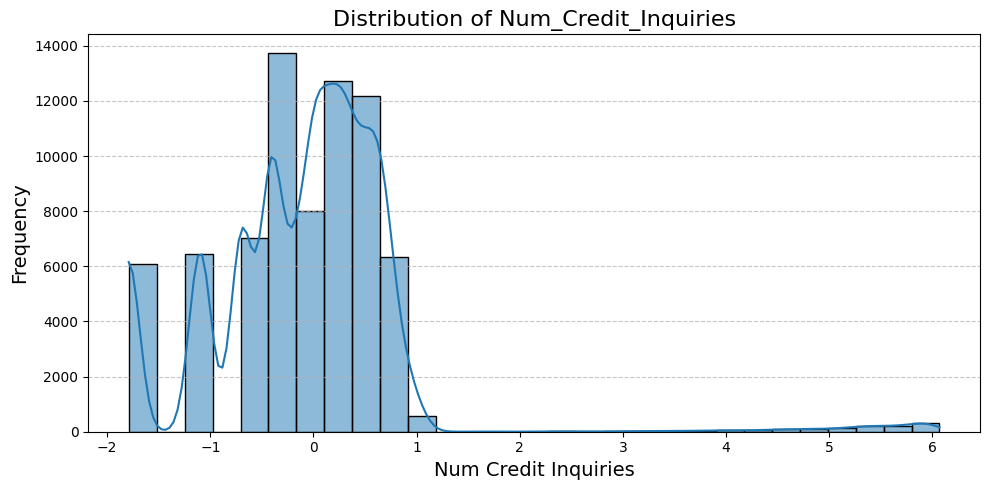

In [190]:
# Histogram for 'Annual_Income'
plt.figure(figsize=(10, 5))
sns.histplot(data=credit_train, x=col, bins=29, kde=True)

plt.title('Distribution of Num_Credit_Inquiries' , fontsize=16)
plt.xlabel('Num Credit Inquiries', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

---

`#`  `'Credit_History_Age'`

In [199]:
credit_train['Credit_History_Age'].unique()

array(['10 Years and 0 Months', nan, '13 Years and 9 Months',
       '16 Years and 2 Months', '19 Years and 4 Months',
       '15 Years and 8 Months', '10 Years and 5 Months',
       '28 Years and 10 Months', '18 Years and 2 Months',
       '11 Years and 11 Months', '20 Years and 5 Months',
       '23 Years and 0 Months', '26 Years and 2 Months',
       '17 Years and 8 Months', '19 Years and 5 Months',
       '2 Years and 10 Months', '25 Years and 0 Months',
       '19 Years and 8 Months', '24 Years and 3 Months',
       '25 Years and 8 Months', '21 Years and 1 Months',
       '22 Years and 5 Months', '18 Years and 10 Months',
       '3 Years and 11 Months', '6 Years and 2 Months',
       '10 Years and 1 Months', '32 Years and 11 Months',
       '26 Years and 4 Months', '12 Years and 8 Months',
       '19 Years and 10 Months', '6 Years and 1 Months',
       '30 Years and 5 Months', '16 Years and 9 Months',
       '30 Years and 11 Months', '19 Years and 7 Months',
       '9 Years and 10

In [200]:
credit_train['Credit_History_Age'].info()

<class 'pandas.core.series.Series'>
Index: 80000 entries, 24171 to 22157
Series name: Credit_History_Age
Non-Null Count  Dtype 
--------------  ----- 
72786 non-null  object
dtypes: object(1)
memory usage: 3.2+ MB


In [372]:
def convert_credit_history_age(age_str):
    if pd.isna(age_str):
        return np.nan
    try:
        years, months_str = age_str.split(' Years and ')
        months = int(months_str.split(' ')[0])
        return int(years) * 12 + months
    except (ValueError, AttributeError):
        return np.nan

In [373]:
credit_train['Credit_History_Age'] = credit_train['Credit_History_Age'].apply(convert_credit_history_age)

median_credit_history_age = credit_train['Credit_History_Age'].median()
credit_train['Credit_History_Age'].fillna(median_credit_history_age, inplace=True)

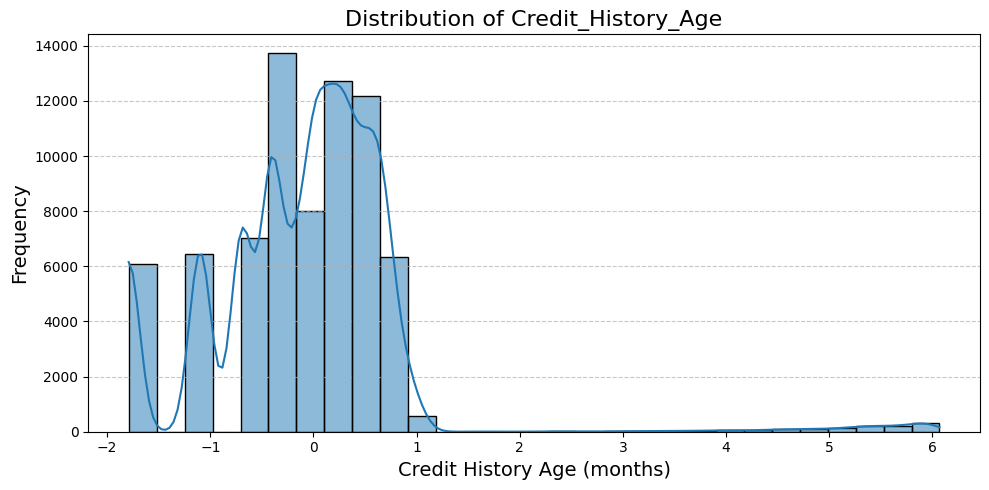

In [374]:
# Histogram for 'Credit_History_Age'
plt.figure(figsize=(10, 5))
sns.histplot(data=credit_train, x=col, bins=29, kde=True)

plt.title('Distribution of Credit_History_Age', fontsize=16)
plt.xlabel('Credit History Age (months)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

---

`#` `'Monthly_Balance'`

In [206]:
credit_train['Monthly_Balance'].info()

<class 'pandas.core.series.Series'>
Index: 80000 entries, 24171 to 22157
Series name: Monthly_Balance
Non-Null Count  Dtype 
--------------  ----- 
79044 non-null  object
dtypes: object(1)
memory usage: 3.2+ MB


In [207]:
credit_train['Monthly_Balance'].unique()

array(['151.42012841148204', nan, '450.74217370605004', ...,
       '665.8376247953622', '590.7592868009949', '755.5558645650029'],
      dtype=object)

In [375]:
# Check which rows in the "monthly_balance" column cannot be converted to numeric values and count them
credit_train[pd.to_numeric(
    credit_train['Monthly_Balance'],
    errors="coerce").isna()]['Monthly_Balance'].value_counts(dropna=False)

,count
Monthly_Balance,
NaN,956
__-333333333333333333333333333__,5


In [376]:
# Replace the invalid value with NaN
credit_train.loc[credit_train['Monthly_Balance'] == "__-333333333333333333333333333__",'Monthly_Balance'] = np.nan

# Convert the column to numeric, handling errors
credit_train['Monthly_Balance'] = pd.to_numeric(credit_train['Monthly_Balance'], errors='coerce')

# Calculate the median
median_value = credit_train['Monthly_Balance'].median()

# Fill missing values with the median
credit_train['Monthly_Balance'].fillna(median_value, inplace=True)

In [210]:
credit_train['Monthly_Balance'].isna().sum()

0

In [377]:
col = 'Monthly_Balance'
# Apply RobustScaler
ro_scaler8 = RobustScaler()
credit_train[col] = ro_scaler8.fit_transform(credit_train[[col]])

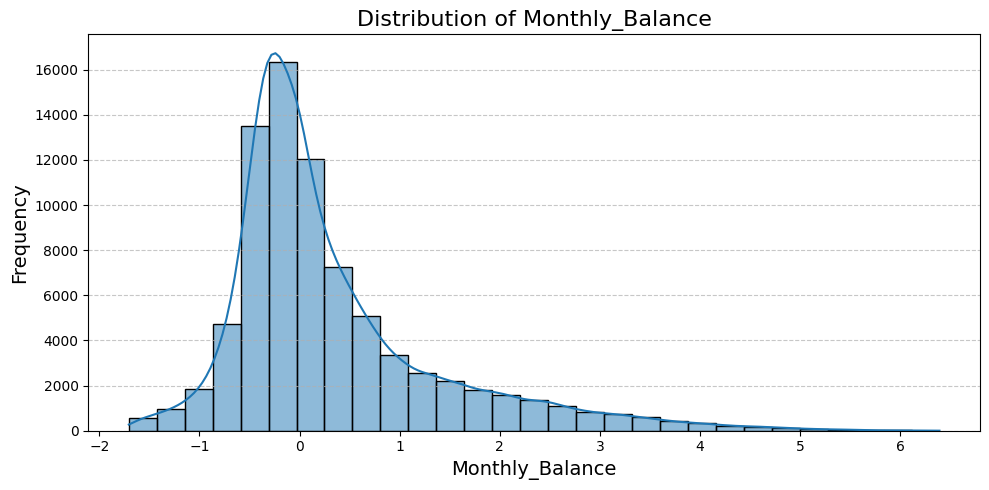

In [213]:
# Histogram for 'Credit_History_Age'
plt.figure(figsize=(10, 5))
sns.histplot(data=credit_train, x=col, bins=29, kde=True)

plt.title('Distribution of Monthly_Balance', fontsize=16)
plt.xlabel('Monthly_Balance', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

---
`iii` Feature engineering:

In [378]:
selected_columns = ['Num_of_Delayed_Payment',
'Delay_from_due_date',
'Credit_Utilization_Ratio',
'Outstanding_Debt',
'Total_EMI_per_month',
'Payment_Behaviour',
'Changed_Credit_Limit',
'Annual_Income',
'Num_Credit_Inquiries',
'Credit_History_Age',
'Monthly_Balance']


X_train_final = credit_train[selected_columns]
y_train = credit_train['Credit_Score']

In [379]:
X_train_final['Debt_to_Income_Ratio'] = X_train_final['Outstanding_Debt'] / X_train_final['Annual_Income']
X_train_final['EMI_to_Income_Ratio'] = X_train_final['Total_EMI_per_month'] / X_train_final['Annual_Income']
X_train_final['Payment_Delay_Rate'] = X_train_final['Num_of_Delayed_Payment'] / X_train_final['Credit_Utilization_Ratio']

# Replace infinite values with NaN
X_train_final.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values with a suitable value, e.g., the median
X_train_final.fillna(X_train_final.median(), inplace=True)

ro_scaler_new = RobustScaler()

X_train_final[['Debt_to_Income_Ratio', 'EMI_to_Income_Ratio', 'Payment_Delay_Rate']] = ro_scaler_new.fit_transform(
    X_train_final[['Debt_to_Income_Ratio', 'EMI_to_Income_Ratio', 'Payment_Delay_Rate']]
)

## `#` Prepare Test Set

Apply the data transformations you used on the training set to the test set.

**Important Note:** DO NOT use `fit` on the test set.

---
`i` More important columns:

In [380]:
# --- 'Num_of_Delayed_Payment' ---
credit_test['Num_of_Delayed_Payment'] = credit_test['Num_of_Delayed_Payment'].str.replace('_', '')
credit_test['Num_of_Delayed_Payment'] = pd.to_numeric(credit_test['Num_of_Delayed_Payment'], errors='coerce')
credit_test['Num_of_Delayed_Payment'].fillna(credit_train['Num_of_Delayed_Payment'].median(), inplace=True)
credit_test['Num_of_Delayed_Payment'] = credit_test['Num_of_Delayed_Payment'].astype(int)

# Reshape before transforming using RobustScaler
credit_test['Num_of_Delayed_Payment'] = ro_scaler1.transform(credit_test[['Num_of_Delayed_Payment']])

# Apply the same Log Transformation
credit_test['Num_of_Delayed_Payment'] = np.log1p(credit_test['Num_of_Delayed_Payment'])

# --- 'Delay_from_due_date' ---
credit_test['Delay_from_due_date'] = ro_scaler2.transform(credit_test[['Delay_from_due_date']])

# --- 'Credit_Utilization_Ratio' ---
credit_test['Credit_Utilization_Ratio'] = scaler.transform(credit_test[['Credit_Utilization_Ratio']])

# --- 'Outstanding_Debt' ---
credit_test['Outstanding_Debt'] = credit_test['Outstanding_Debt'].str.replace('_', '')
credit_test['Outstanding_Debt'] = credit_test['Outstanding_Debt'].astype(float)
credit_test['Outstanding_Debt'] = ro_scaler3.transform(credit_test[['Outstanding_Debt']])
credit_test['Outstanding_Debt'] = np.log1p(credit_test['Outstanding_Debt'])

# --- 'Total_EMI_per_month' ---
credit_test['emi_lower_bound'] = credit_test['Monthly_Inhand_Salary'] * 0.30
credit_test['emi_upper_bound'] = credit_test['Monthly_Inhand_Salary'] * 0.40
credit_test['Total_EMI_per_month'] = credit_test['Total_EMI_per_month'].clip(credit_test['emi_lower_bound'], credit_test['emi_upper_bound'])
credit_test.drop(columns=['emi_lower_bound', 'emi_upper_bound'], inplace=True)

credit_test['Total_EMI_per_month'] = ro_scaler4.transform(credit_test[['Total_EMI_per_month']])
credit_test['Total_EMI_per_month'] = np.log1p(credit_test['Total_EMI_per_month'])

# --- 'Payment_Behaviour' ---
credit_test.loc[credit_test['Payment_Behaviour'] == "!@9#%8", 'Payment_Behaviour'] = np.nan
credit_test['Payment_Behaviour'].fillna(payment_behaviour_mode, inplace=True)
credit_test['Payment_Behaviour'] = le1.transform(credit_test['Payment_Behaviour'])

# --- 'Changed_Credit_Limit' ---
credit_test.loc[credit_test['Changed_Credit_Limit'] == "_", 'Changed_Credit_Limit'] = np.nan
credit_test['Changed_Credit_Limit'] = pd.to_numeric(credit_test['Changed_Credit_Limit'], errors='coerce')
credit_test['Changed_Credit_Limit'].fillna(credit_train['Changed_Credit_Limit'].median(), inplace=True)

credit_test['Changed_Credit_Limit'] = ro_scaler5.transform(credit_test[['Changed_Credit_Limit']])

# --- 'Annual_Income' ---
credit_test['Annual_Income'] = credit_test['Annual_Income'].str.replace('_', '')
credit_test['Annual_Income'] = credit_test['Annual_Income'].astype(float)
credit_test['Annual_Income'] = ro_scaler6.transform(credit_test[['Annual_Income']])
credit_test['Annual_Income'] = np.log1p(credit_test['Annual_Income'])


# --- 'Credit_Score' ---
credit_test['Credit_Score'] = le2.transform(credit_test['Credit_Score'])

# --- Final Test ---
X_test = credit_test[selected_columns]
y_test = credit_test['Credit_Score']

X_test.replace([np.inf, -np.inf], np.nan, inplace=True)
X_test.fillna(X_train.median(), inplace=True)  # Fill missing values with training data median


---
`#` Remove outliers:

In [278]:
# Convert all columns in X_test to numeric, handling errors
for col in X_test.columns:
    X_test[col] = pd.to_numeric(X_test[col], errors='coerce')

# Fill NaN values after conversion (using median from training set, for example)
X_test.fillna(X_train.median(), inplace=True)

# Now proceed with outlier removal
X_test_no_outlier = remove_outliers(X_test)

---
`#` Handle outliers:

In [279]:
# Copy the original test data
X_test_handle_outlier = X_test.copy()

# Define columns to process
columns_to_clip = ['Num_of_Delayed_Payment', 'Outstanding_Debt', 'Annual_Income']

# Apply the same clipping using X_train quantiles
for col in columns_to_clip:
    lower = X_train[col].quantile(0.01)  # Use training data quantiles
    upper = X_train[col].quantile(0.99)
    X_test_handle_outlier[col] = np.clip(X_test[col], lower, upper)

---
`ii` Add more relevant columns:

In [381]:
# --- 'Num_Credit_Inquiries' ---
credit_test['Num_Credit_Inquiries'].fillna(credit_train['Num_Credit_Inquiries'].median(), inplace=True)
credit_test['Num_Credit_Inquiries'] = ro_scaler7.transform(credit_test[['Num_Credit_Inquiries']])
credit_test['Num_Credit_Inquiries'] = np.log1p(credit_test['Num_Credit_Inquiries'])

# --- 'Credit_History_Age' ---
credit_test['Credit_History_Age'] = credit_test['Credit_History_Age'].apply(convert_credit_history_age)
credit_test['Credit_History_Age'].fillna(median_credit_history_age, inplace=True)

# --- 'Monthly_Balance' ---
credit_test.loc[credit_test['Monthly_Balance'] == "__-333333333333333333333333333__", 'Monthly_Balance'] = np.nan
credit_test['Monthly_Balance'] = pd.to_numeric(credit_test['Monthly_Balance'], errors='coerce')
credit_test['Monthly_Balance'].fillna(credit_train['Monthly_Balance'].median(), inplace=True)
credit_test['Monthly_Balance'] = ro_scaler8.transform(credit_test[['Monthly_Balance']])

# --- Final Test ---
X_test_final = credit_test[selected_columns]
y_test = credit_test['Credit_Score']

X_test_final['Debt_to_Income_Ratio'] = X_test_final['Outstanding_Debt'] / X_test_final['Annual_Income']
X_test_final['EMI_to_Income_Ratio'] = X_test_final['Total_EMI_per_month'] / X_test_final['Annual_Income']
X_test_final['Payment_Delay_Rate'] = X_test_final['Num_of_Delayed_Payment'] / X_test_final['Credit_Utilization_Ratio']

# Replace infinite values with NaN
X_test_final.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values with the median of corresponding columns in the training set
X_test_final.fillna(X_train_final.median(), inplace=True)

# Apply the same RobustScaler
X_test_final[['Debt_to_Income_Ratio', 'EMI_to_Income_Ratio', 'Payment_Delay_Rate']] = ro_scaler_new.transform(
    X_test_final[['Debt_to_Income_Ratio', 'EMI_to_Income_Ratio', 'Payment_Delay_Rate']]
)


----------------------

# `05` Logistic Regression

Using `sklearn` implementation of logistic regression to model the data.

Hint: Look for `sklearn.linear_model.LogisticRegression` class.

## `i` Baseline Model Training

Initializing the model with initial parameters, fitting it to the training data, and get a baseline model.

Use:
- Non-regularized model.
- `random_state` $= 1234$

`i` `Model1`: Most Important Features





In [163]:
log_reg1 = LogisticRegression(random_state=1234, max_iter=1000)

log_reg1.fit(X_train, y_train)

y_pred = log_reg1.predict(X_test)

`ii` `Model2`: No Outliers

In [166]:
log_reg_no_outlier = LogisticRegression(random_state=1234, max_iter=1000)

log_reg_no_outlier.fit(X_train_no_outlier, y_train_no_outlier)

y_pred_no_outlier = log_reg_no_outlier.predict(X_test_no_outlier)

`iii` `Model3`: Handle Outliers

In [171]:
log_reg_handle_outlier = LogisticRegression(random_state=1234, max_iter=1000)

log_reg_handle_outlier.fit(X_train_handle_outlier, y_train)

y_pred_handle_outlier = log_reg_handle_outlier.predict(X_test_handle_outlier)

`iiii` `Model4`: Add more columns

In [382]:
log_reg_more = LogisticRegression(random_state=1234, max_iter=1000)

log_reg_more.fit(X_train_final, y_train)

y_pred_more = log_reg_more.predict(X_test_final)

## `ii` Model Evaluation

Evaluate the baseline model performance using classification metrics, e.g. **Accuracy**, **Precision**, $F_1 \space Score$, **Confusion Matrix** etc.

Which metric is more reliable?

`i` `Model1`: Most Important Features

In [164]:
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.4f}')

print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6018
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.23      0.31      3566
           1       0.65      0.47      0.54      5799
           2       0.60      0.80      0.69     10635

    accuracy                           0.60     20000
   macro avg       0.58      0.50      0.51     20000
weighted avg       0.60      0.60      0.58     20000



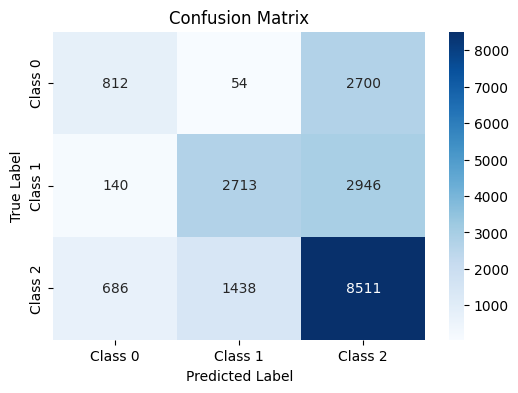

In [165]:
cm = confusion_matrix(y_test, y_pred)


plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1', 'Class 2'],
            yticklabels=['Class 0', 'Class 1', 'Class 2'])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


`ii` `Model2`: No Outliers

In [167]:
accuracy = accuracy_score(y_test_no_outlier, y_pred_no_outlier)
print(f'Accuracy: {accuracy:.4f}')

print("Classification Report:\n", classification_report(y_test_no_outlier, y_pred_no_outlier))

Accuracy: 0.6065
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.21      0.29      3133
           1       0.64      0.45      0.53      4989
           2       0.61      0.82      0.70      9659

    accuracy                           0.61     17781
   macro avg       0.58      0.49      0.51     17781
weighted avg       0.60      0.61      0.58     17781



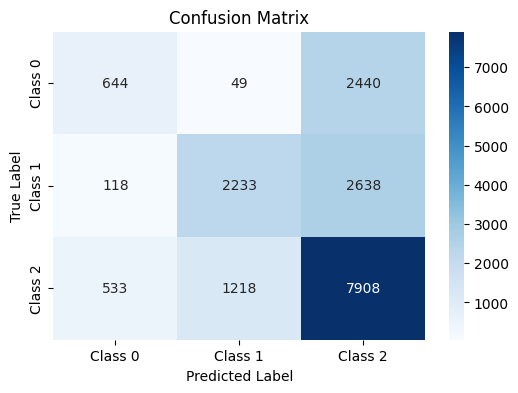

In [168]:
cm = confusion_matrix(y_test_no_outlier, y_pred_no_outlier)


plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1', 'Class 2'],
            yticklabels=['Class 0', 'Class 1', 'Class 2'])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

`iii` `Model3`: Handle Outliers

In [172]:
accuracy = accuracy_score(y_test, y_pred_handle_outlier)
print(f'Accuracy: {accuracy:.4f}')

print("Classification Report:\n", classification_report(y_test, y_pred_handle_outlier))

Accuracy: 0.6029
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.23      0.31      3566
           1       0.65      0.47      0.54      5799
           2       0.60      0.80      0.69     10635

    accuracy                           0.60     20000
   macro avg       0.58      0.50      0.52     20000
weighted avg       0.60      0.60      0.58     20000



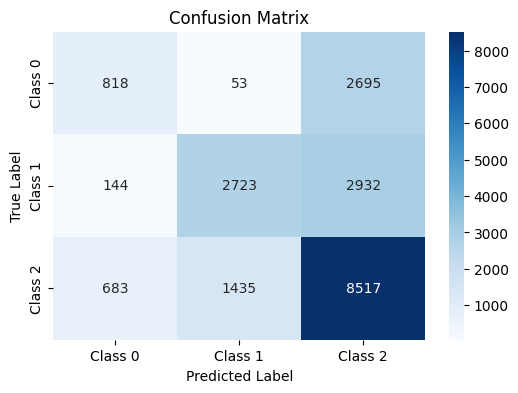

In [173]:
cm = confusion_matrix(y_test, y_pred_handle_outlier)


plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1', 'Class 2'],
            yticklabels=['Class 0', 'Class 1', 'Class 2'])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

`iiii` `Model4`: Add more columns

In [383]:
accuracy = accuracy_score(y_test, y_pred_more)
print(f'Accuracy: {accuracy:.4f}')

print("Classification Report:\n", classification_report(y_test, y_pred_more))

Accuracy: 0.6083
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.24      0.32      3566
           1       0.65      0.49      0.56      5799
           2       0.61      0.80      0.69     10635

    accuracy                           0.61     20000
   macro avg       0.59      0.51      0.52     20000
weighted avg       0.60      0.61      0.59     20000



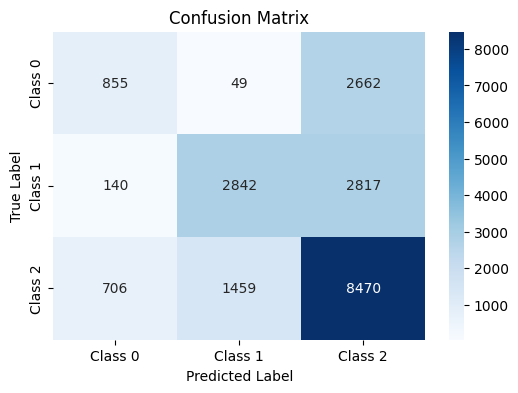

In [384]:
cm = confusion_matrix(y_test, y_pred_more)


plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1', 'Class 2'],
            yticklabels=['Class 0', 'Class 1', 'Class 2'])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## `iii` Regularization Mode: On

Let's try the default $l_2$ regularization. Use default $C$ parameter for simplicity. Does regularization make the model generalize better?

`Bonus:` You can use `solver='saga'` parameter to be able to try the $l_1$ regularization and compare the two.

In [178]:
log_reg2 = LogisticRegression(C=0.03359818286283781, max_iter=2000, penalty=None,
                   random_state=1234, solver='saga', class_weight= 'balanced')

log_reg2.fit(X_train, y_train)

y_pred = log_reg2.predict(X_test)

In [179]:
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.4f}')

print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.5514
Classification Report:
               precision    recall  f1-score   support

           0       0.39      0.77      0.52      3566
           1       0.57      0.70      0.63      5799
           2       0.73      0.40      0.51     10635

    accuracy                           0.55     20000
   macro avg       0.56      0.62      0.55     20000
weighted avg       0.62      0.55      0.55     20000



## `iv` Tuning Hyperparameters

1. Try different `C` values and evaluate. What is the best panalty value?
2. Try training the model while using the `class_weight` parameter and compare the results. Did it affect the model evaluation?
3. You can tune other parameters as you see fit (but make sure you elaborate your reasoning).

`Note:` Remember that $alpha=\frac{1}{C}$ which means less regularization for higher $C$ values.

`Hint:` You might want to use `sklearn.model_selection.RandomizedSearchCV` or `sklearn.model_selection.GridSearchCV` classes.

In [104]:
param_grid = {
    'C': np.logspace(-4, 4, 20),
    'penalty': ['l1', 'l2', 'elasticnet', None],
    'solver': ['liblinear', 'saga']
}

random_search = RandomizedSearchCV(LogisticRegression(random_state=1234, max_iter=2000, class_weight= 'balanced'),
                                   param_distributions=param_grid, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search.fit(X_train, y_train)

print("Best Parameter", random_search.best_params_)

best_log_reg = random_search.best_estimator_
best_log_reg.fit(X_train, y_train)


Best Parameter {'solver': 'saga', 'penalty': 'l2', 'C': 0.03359818286283781}


LogisticRegression(C=0.03359818286283781, max_iter=2000, random_state=1234,
                   solver='saga')

-----------------------------

# `06` Logistic Regression with Gradient Descent

The `LogisticRegression` class optimizes the model paramters via solvers (e.g., `lbfgs`, `saga`, etc.) instead of using gradient descent.

If we want to train the logistic regression model using gradient descent we can use `SGDClassifier` and tune the parameters almost the same way we did with `SGDRegressor`.

Try this and do hyperparameter tuning if needed to decide which model is better.

`Notes:`
- You will have to set `loss='log_loss'` to use `SGDClassifier` as a logistic regression model.
- The `alpha` parameter is the inverse of the `C` parameter and hence bigger values will result in more regularization.



In [182]:
# Initialize SGDClassifier for logistic regression
sgd_log_reg = SGDClassifier(loss='log_loss', random_state=1234, max_iter=1000)

# Train the model
sgd_log_reg.fit(X_train, y_train)

# Make predictions
y_pred_sgd = sgd_log_reg.predict(X_test)

# Evaluate the model
accuracy_sgd = accuracy_score(y_test, y_pred_sgd)
print(f'SGD Logistic Regression Accuracy: {accuracy_sgd:.4f}')
print("Classification Report:\n", classification_report(y_test, y_pred_sgd))

# Hyperparameter tuning using RandomizedSearchCV
param_grid_sgd = {
    'alpha': np.logspace(-4, 4, 20),
    'penalty': ['l1', 'l2', 'elasticnet'],
    'l1_ratio': np.linspace(0,1,10)
}

random_search_sgd = RandomizedSearchCV(SGDClassifier(loss='log_loss', random_state=1234, max_iter=1000),
                                       param_distributions=param_grid_sgd, n_iter=20, cv=5, scoring='accuracy', random_state=42)

random_search_sgd.fit(X_train, y_train)

print("Best Hyperparameters (SGD):", random_search_sgd.best_params_)

best_sgd_log_reg = random_search_sgd.best_estimator_

# Train and evaluate the best model
best_sgd_log_reg.fit(X_train, y_train)
y_pred_best_sgd = best_sgd_log_reg.predict(X_test)
accuracy_best_sgd = accuracy_score(y_test, y_pred_best_sgd)

print(f"Best SGD Logistic Regression Accuracy: {accuracy_best_sgd:.4f}")
print("Classification Report (Best SGD):\n", classification_report(y_test, y_pred_best_sgd))


SGD Logistic Regression Accuracy: 0.5965
Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.09      0.16      3566
           1       0.65      0.45      0.53      5799
           2       0.59      0.85      0.69     10635

    accuracy                           0.60     20000
   macro avg       0.57      0.46      0.46     20000
weighted avg       0.58      0.60      0.55     20000

Best Hyperparameters (SGD): {'penalty': 'l2', 'l1_ratio': 1.0, 'alpha': 0.0018329807108324356}
Best SGD Logistic Regression Accuracy: 0.5996
Classification Report (Best SGD):
               precision    recall  f1-score   support

           0       0.49      0.07      0.12      3566
           1       0.64      0.48      0.55      5799
           2       0.59      0.84      0.69     10635

    accuracy                           0.60     20000
   macro avg       0.57      0.46      0.45     20000
weighted avg       0.59      0.60      0.55     2000

------------------

# `07` Generalization Error

Now that we have tuned our solution, to an *extent*, we need to test for a final time on the held out test set.

In [106]:
models = {
    "Logistic Regression 1": log_reg1,  # First logistic model
    "Logistic Regression 2": log_reg2,  # Second logistic model
    "SGD Classifier": sgd_log_reg       # Stochastic Gradient Descent model
}

for name, model in models.items():
    print(f"\n===== {name} =====")

    # Predictions
    y_test_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    conf_matrix = confusion_matrix(y_test, y_pred)

    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1 Score: {f1:.4f}')
    print('Confusion Matrix:')
    print(conf_matrix)


===== Logistic Regression 1 =====
Accuracy: 0.6017
Precision: 0.5951
Recall: 0.6017
F1 Score: 0.5779
Confusion Matrix:
[[ 813   54 2699]
 [ 140 2708 2951]
 [ 685 1437 8513]]

===== Logistic Regression 2 =====
Accuracy: 0.6017
Precision: 0.5951
Recall: 0.6017
F1 Score: 0.5779
Confusion Matrix:
[[ 813   54 2699]
 [ 140 2708 2951]
 [ 685 1437 8513]]

===== SGD Classifier =====
Accuracy: 0.6017
Precision: 0.5951
Recall: 0.6017
F1 Score: 0.5779
Confusion Matrix:
[[ 813   54 2699]
 [ 140 2708 2951]
 [ 685 1437 8513]]


----------------------------------------------

$$ Wish \space you \space all \space the \space best \space ♡ $$
